<h1 align="center">Comparison between Control and tetX LFP data</h1> 

In [1]:
!date

Wed Jun 22 17:58:45 PDT 2022


___

## Import packages

In [2]:
%load_ext blackcellmagic
%config InlineBackend.figure_format='retina'

In [3]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib as matplotlib
from matplotlib.ticker import MultipleLocator

import panel as pn
pn.extension()

____

## Load data from csv files

Merge split csv files:

In [4]:
!cat clean_data/control_clean_multi-channel_aa clean_data/control_clean_multi-channel_ab clean_data/control_clean_multi-channel_ac > Control_clean_multi-channel.csv
!cat clean_data/tetX_clean_multi-channel_aa clean_data/tetX_clean_multi-channel_ab > tetX_clean_multi-channel.csv

Load csv files containing control data:

In [5]:
ctrl_df = pd.read_csv("Control_clean_multi-channel.csv")
ctrl_df.head()

,date,daytime,day,channel,hour,freq,power,condition,animal_ID
0,09/02-00/00,evening,1,2,7,1,3167.031258,Control,Or295
1,09/02-00/00,evening,1,2,7,2,3965.741007,Control,Or295
2,09/02-00/00,evening,1,2,7,3,3645.064582,Control,Or295
3,09/02-00/00,evening,1,2,7,4,2987.164936,Control,Or295
4,09/02-00/00,evening,1,2,7,5,2328.527143,Control,Or295


Split animals and evening and morning data:

In [6]:
or295_morn = ctrl_df[(ctrl_df["daytime"] == "morning") & (ctrl_df["animal_ID"] == "Or295")]
pk31_morn = ctrl_df[(ctrl_df["daytime"] == "morning") & (ctrl_df["animal_ID"] == "PK31")]

or295_eve = ctrl_df[(ctrl_df["daytime"] == "evening") & (ctrl_df["animal_ID"] == "Or295")]
pk31_eve = ctrl_df[(ctrl_df["daytime"] == "evening") & (ctrl_df["animal_ID"] == "PK31")]

Load csv files containing experiment data:

In [7]:
tetx_df = pd.read_csv("tetX_clean_multi-channel.csv")
tetx_df.head()

,date,daytime,day,channel,hour,freq,power,condition,animal_ID
0,05/02-05/11,evening,3,2,7,1,3053.985797,tetX,Or296
1,05/02-05/11,evening,3,2,7,2,5047.081513,tetX,Or296
2,05/02-05/11,evening,3,2,7,3,5415.693307,tetX,Or296
3,05/02-05/11,evening,3,2,7,4,4765.651515,tetX,Or296
4,05/02-05/11,evening,3,2,7,5,3900.331711,tetX,Or296


Split evening and morning data:

In [8]:
or296_morn = tetx_df[(tetx_df["daytime"] == "morning") & (tetx_df["animal_ID"] == "Or296")]
b138_morn = tetx_df[(tetx_df["daytime"] == "morning") & (tetx_df["animal_ID"] == "B138")]

or296_eve = tetx_df[(tetx_df["daytime"] == "evening") & (tetx_df["animal_ID"] == "Or296")]
b138_eve = tetx_df[(tetx_df["daytime"] == "evening") & (tetx_df["animal_ID"] == "B138")]

___

## Calculate median and 25th and 75th percentile of power values on data binned by frequency:

In [9]:
# # Correct way to group the data for the calculation in median_perc, but for some reason this does not return all of the data
# grouped = or295_eve.groupby(["day"])[["power"]]

# meanP = grouped.mean().rename(columns={"power": "mean_power"})
# P_25per = grouped.quantile(q=0.25).rename(columns={"power": "power_25per"})
# P_75per = grouped.quantile(q=0.75).rename(columns={"power": "power_75per"})

# pd.concat([meanP, P_25per, P_75per])

In [10]:
def median_perc(df):
    """
    Function to get the median and 25% and 75% percentile power values.
    """
    medianP = []
    P_25per = []
    P_75per = []
    P_std = []
    days = []
    waves = []

    for day in np.unique(df["day"].values):
        # Calculate mean
        medianP.append(df[df["day"] == day]["power"].median())
        # Calculate 25th percentile
        P_25per.append(df[df["day"] == day]["power"].quantile(q=0.25))
        # Calculate 75th percentile
        P_75per.append(df[df["day"] == day]["power"].quantile(q=0.75))
        # Calculate STD
        P_std.append(df[df["day"] == day]["power"].std())
        # Record day
        days.append(day)
        # Record wave
        waves.append(np.unique(df["wave"].values)[0])
        

    # Add data to new data frame    
    plt_df = pd.DataFrame()
    plt_df["wave"] = waves
    plt_df["day"] = days
    plt_df["median_power"] = medianP
    plt_df["power_25perc"] = P_25per
    plt_df["power_75perc"] = P_75per
    plt_df["STD"] = P_std

    return plt_df

## Bin frequencies

In [11]:
def bin_(df):
    """
    Function to bin data by frequency bins and calculate values to plot
    (median, 25th and 75th percentile, and STD) using the function median_perc.
    
    Frequency bins:  
    1-3 Hz (delta)  
    4-7 Hz (theta)  
    8-12 (alpha)  
    18-25 (beta)  
    30-70 Hz (gamma)
    71-200 Hz (other)
    """
    
    # Bin frequency values by splitting data frame
    df_delta = df.loc[df['freq'].isin([1,2,3])]
    df_delta["wave"] = "delta"
    df_theta = df.loc[df['freq'].isin([4,5,6,7])]
    df_theta["wave"] = "theta"
    df_alpha = df.loc[df['freq'].isin(np.arange(13)[8:])]
    df_alpha["wave"] = "alpha"
    df_beta = df.loc[df['freq'].isin(np.arange(26)[18:])]
    df_beta["wave"] = "beta"
    df_gamma = df.loc[df['freq'].isin(np.arange(71)[30:])]
    df_gamma["wave"] = "gamma"
    df_other = df.loc[df['freq'].isin(np.arange(201)[71:])]
    df_other["wave"] = "other"
    
    # Calculate median and 25th and 75th percentile of power values
    df_delta_plt = median_perc(df_delta)
    df_theta_plt = median_perc(df_theta)
    df_alpha_plt = median_perc(df_alpha)
    df_beta_plt = median_perc(df_beta)
    df_gamma_plt = median_perc(df_gamma)
    df_other_plt = median_perc(df_other)
    
    # Return concatenated data frames
    return pd.concat([df_delta_plt, df_theta_plt, df_alpha_plt, df_beta_plt, df_gamma_plt, df_other_plt], join="outer").reset_index(drop=True)

Use the functions above to bin the frequencies and plot the calculated values (median, percentiles and STD):

In [12]:
# Use the functions above to bin the frequencies and get dfs with the calculated values (median, percentiles and STD) for each bird

## Evening data
plt_or295_eve = bin_(or295_eve)
plt_pk31_eve = bin_(pk31_eve)
plt_or296_eve = bin_(or296_eve)
plt_b138_eve = bin_(b138_eve)

# Create list of dataframes containing evening data
df_list = [plt_or295_eve, plt_pk31_eve, plt_or296_eve, plt_b138_eve]

## Morning data
plt_or295_morn = bin_(or295_morn)
plt_pk31_morn = bin_(pk31_morn)
plt_or296_morn = bin_(or296_morn)
plt_b138_morn = bin_(b138_morn)

# Create list of dataframes containing morning data
df_list_morn = [plt_or295_morn, plt_pk31_morn, plt_or296_morn, plt_b138_morn]

/var/folders/gd/8j_w3s656d1gkl7jfdnptqpc0000gq/T/ipykernel_63228/668769592.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_delta["wave"] = "delta"
/var/folders/gd/8j_w3s656d1gkl7jfdnptqpc0000gq/T/ipykernel_63228/668769592.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_theta["wave"] = "theta"
/var/folders/gd/8j_w3s656d1gkl7jfdnptqpc0000gq/T/ipykernel_63228/668769592.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,c

## Plot evening data:

In [13]:
colors = ["#0571b0", "#a6cee3", "#e66101", "#fdb863"]
# labels = ["Or295 (control)", "PK31 (control)", "Or296 (tetX)", "B138 (tetX)"]
labels = ["Control 1", "Control 2", "TetX 1", "TetX 2"]
freq_bins = ["1-3 Hz (delta)", "4-7 Hz (theta)", "8-12 Hz (alpha)", "18-25 Hz (beta)", "30-70 Hz (gamma)", "(71-200 Hz (other)"]
waves = ["delta", "theta", "alpha", "beta", "gamma", "other"]

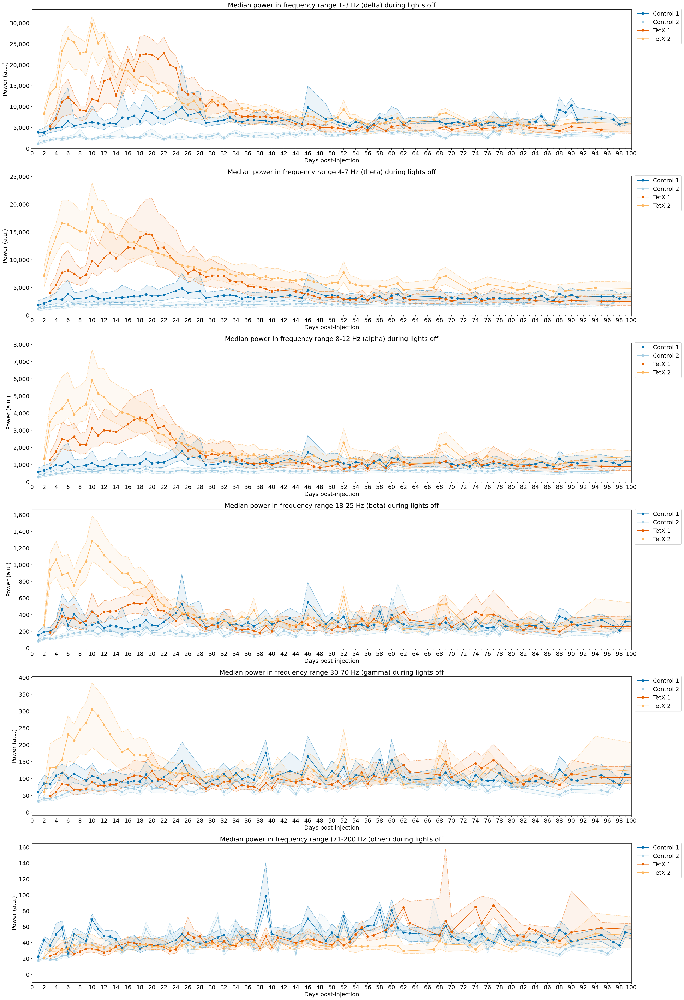

In [14]:
fig, axs = plt.subplots(figsize=(30,50), nrows=6)
fontsize = 16
fontdict = {
    'weight': 'normal',
    'size': fontsize,
    }
         
for (idx, wave), ax in zip(enumerate(waves), axs):
    for i, dataframe in enumerate(df_list):
        df = dataframe[dataframe["wave"]==wave]
        # Shortcuts to x and y values
        x = df["day"].values
        y = df["median_power"].values
        y_25 = df["power_25perc"].values
        y_75 = df["power_75perc"].values
        y_std = df["STD"].values
        
        # Plot median line
        ax.plot(x, y, color=colors[i], marker="o", label=labels[i], zorder=2)
        
        # Plot percentiles
        # ax.plot(x, y_25, color=colors[i], ls="-.", alpha=0.5,label="25$^{th}$-75$^{th}$ %")
        ax.plot(x, y_25, color=colors[i], ls="-.", alpha=0.5)
        ax.plot(x, y_75, color=colors[i], ls="-.", alpha=0.5)
        # Fill space between percentile bands
        ax.fill_between(x, y_25, y_75, alpha=0.075, color=colors[i])
        
        # Plot STD
        # ax.plot(x, y+y_std, color=colors[i], ls="--", label="SD", alpha=0.3)
        # ax.plot(x, y-y_std, color=colors[i], ls="--", alpha=0.3) 
        # # Fill space between STD bands
        # ax.fill_between(x, y+y_std, y-y_std, alpha=0.05, color=colors[i])

    # Add legend
    ax.legend(bbox_to_anchor=(1.001, 1.025), loc='upper left', fontsize=fontsize)
    
    # Set title
    ax.set_title(f"Median power in frequency range {freq_bins[idx]} during lights off", fontsize=fontsize+2)

    # Customize axes labels
    ax.tick_params(axis='both', which='major', labelsize=fontsize)
    ax.set_xlabel("Days post-injection", fontdict=fontdict)
    ax.set_ylabel("Power (a.u.)", fontdict=fontdict)

    # Set major ticks to be multiples of 2
    ax.xaxis.set_major_locator(MultipleLocator(2))
    # For the minor ticks, use no labels; default NullFormatter.
    ax.xaxis.set_minor_locator(MultipleLocator(1))

    # Set x-axis limit
    ax.set_xlim(left=0, right=100)
    
    # Set y-axis bottom
    ax.set_ylim(bottom=-10)
    
    # Add thousands separator to y axis
    ax.get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

    # Add grid
    # ax.grid(visible=True, which="both")
    ax.set_axisbelow(True)

fig.savefig("figures/long-term_LFP_all_freqs.png", dpi=300, bbox_inches="tight")
fig.savefig("figures/long-term_LFP_all_freqs.svg", dpi=300, bbox_inches="tight")
fig.savefig("figures/long-term_LFP_all_freqs.pdf", dpi=300, bbox_inches="tight")

plt.show()

Plot up to 200 dpi:

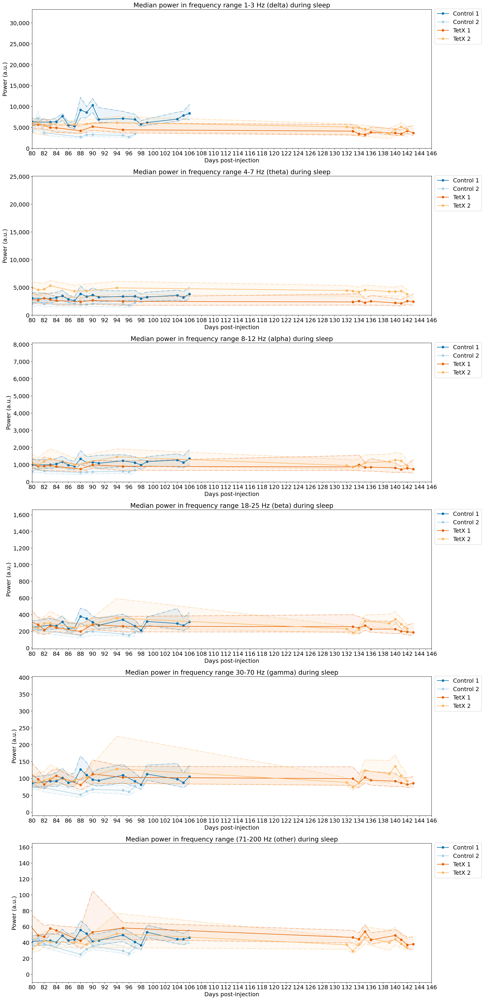

In [15]:
fig, axs = plt.subplots(figsize=(20,50), nrows=6)
fontsize = 16
fontdict = {
    'weight': 'normal',
    'size': fontsize,
    }
         
for (idx, wave), ax in zip(enumerate(waves), axs):
    for i, dataframe in enumerate(df_list):
        df = dataframe[dataframe["wave"]==wave]
        # Shortcuts to x and y values
        x = df["day"].values
        y = df["median_power"].values
        y_25 = df["power_25perc"].values
        y_75 = df["power_75perc"].values
        y_std = df["STD"].values

        # Plot median line
        ax.plot(x, y, color=colors[i], marker="o", label=labels[i], zorder=2)
        
        # Plot percentiles
        # ax.plot(x, y_25, color=colors[i], ls="-.", alpha=0.5,label="25$^{th}$-75$^{th}$ %")
        ax.plot(x, y_25, color=colors[i], ls="-.", alpha=0.5)
        ax.plot(x, y_75, color=colors[i], ls="-.", alpha=0.5)
        # Fill space between percentile bands
        ax.fill_between(x, y_25, y_75, alpha=0.075, color=colors[i])
        
        # Plot STD
        # ax.plot(x, y+y_std, color=colors[i], ls="--", label="SD", alpha=0.3)
        # ax.plot(x, y-y_std, color=colors[i], ls="--", alpha=0.3) 
        # # Fill space between STD bands
        # ax.fill_between(x, y+y_std, y-y_std, alpha=0.05, color=colors[i])

    # Add legend
    ax.legend(bbox_to_anchor=(1.001, 1.025), loc='upper left', fontsize=fontsize)
    
    # Set title
    ax.set_title(f"Median power in frequency range {freq_bins[idx]} during sleep", fontsize=fontsize+2)

    # Customize axes labels
    ax.tick_params(axis='both', which='major', labelsize=fontsize)
    ax.set_xlabel("Days post-injection", fontdict=fontdict)
    ax.set_ylabel("Power (a.u.)", fontdict=fontdict)

    # Set major ticks to be multiples of 2
    ax.xaxis.set_major_locator(MultipleLocator(2))
    # For the minor ticks, use no labels; default NullFormatter.
    ax.xaxis.set_minor_locator(MultipleLocator(1))

    # Set x-axis limit
    ax.set_xlim(left=80, right=146)
    
    # Set y-axis bottom
    ax.set_ylim(bottom=-10)
    
    # Add thousands separator to y axis
    ax.get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

    # Add grid
    # ax.grid(visible=True, which="both")
    ax.set_axisbelow(True)

fig.savefig("figures/long-term_LFP_all_freqs_dpi80-145.png", dpi=300, bbox_inches="tight")
fig.savefig("figures/long-term_LFP_all_freqs_dpi80-145.svg", dpi=300, bbox_inches="tight")
fig.savefig("figures/long-term_LFP_all_freqs_dpi80-145.pdf", dpi=300, bbox_inches="tight")

plt.show()

# Plot morning data

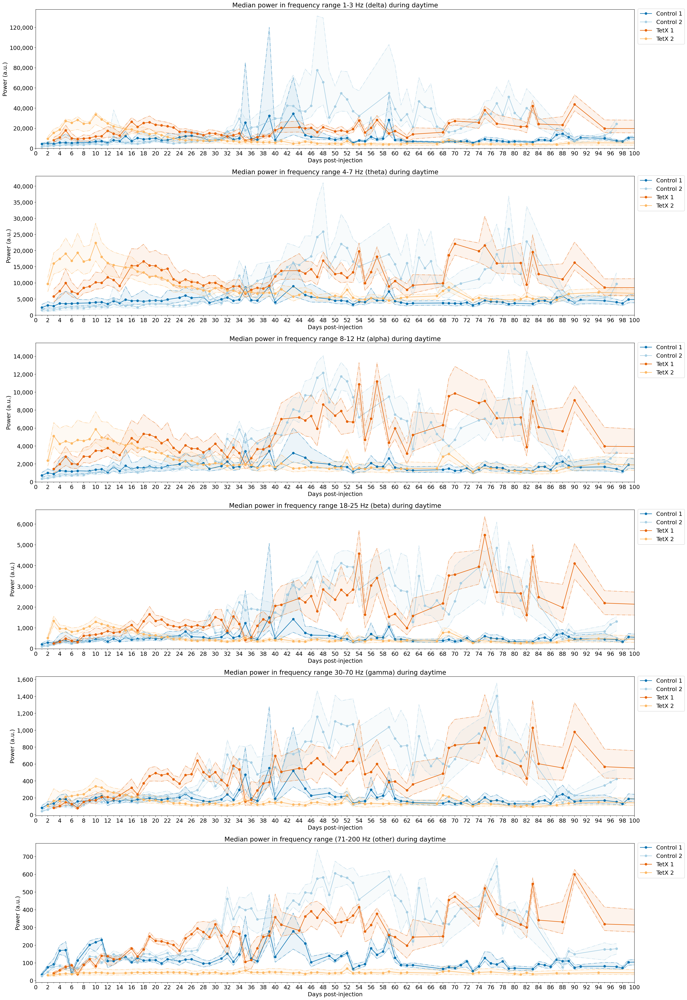

In [16]:
fig, axs = plt.subplots(figsize=(30,50), nrows=6)
fontsize = 16
fontdict = {
    'weight': 'normal',
    'size': fontsize,
    }
         
for (idx, wave), ax in zip(enumerate(waves), axs):
    for i, dataframe in enumerate(df_list_morn):
        df = dataframe[dataframe["wave"]==wave]
        # Shortcuts to x and y values
        x = df["day"].values
        y = df["median_power"].values
        y_25 = df["power_25perc"].values
        y_75 = df["power_75perc"].values
        y_std = df["STD"].values
        
        # Plot median line
        ax.plot(x, y, color=colors[i], marker="o", label=labels[i], zorder=2)
        
        # Plot percentiles
        # ax.plot(x, y_25, color=colors[i], ls="-.", alpha=0.5,label="25$^{th}$-75$^{th}$ %")
        ax.plot(x, y_25, color=colors[i], ls="-.", alpha=0.5)
        ax.plot(x, y_75, color=colors[i], ls="-.", alpha=0.5)
        # Fill space between percentile bands
        ax.fill_between(x, y_25, y_75, alpha=0.075, color=colors[i])
        
        # Plot STD
        # ax.plot(x, y+y_std, color=colors[i], ls="--", label="SD", alpha=0.3)
        # ax.plot(x, y-y_std, color=colors[i], ls="--", alpha=0.3) 
        # # Fill space between STD bands
        # ax.fill_between(x, y+y_std, y-y_std, alpha=0.05, color=colors[i])

    # Add legend
    ax.legend(bbox_to_anchor=(1.001, 1.025), loc='upper left', fontsize=fontsize)
    
    # Set title
    ax.set_title(f"Median power in frequency range {freq_bins[idx]} during daytime", fontsize=fontsize+2)

    # Customize axes labels
    ax.tick_params(axis='both', which='major', labelsize=fontsize)
    ax.set_xlabel("Days post-injection", fontdict=fontdict)
    ax.set_ylabel("Power (a.u.)", fontdict=fontdict)

    # Set major ticks to be multiples of 2
    ax.xaxis.set_major_locator(MultipleLocator(2))
    # For the minor ticks, use no labels; default NullFormatter.
    ax.xaxis.set_minor_locator(MultipleLocator(1))

    # Set x-axis limit
    ax.set_xlim(left=0, right=100)
    
    # Set y-axis bottom
    ax.set_ylim(bottom=-10)
    
    # Add thousands separator to y axis
    ax.get_yaxis().set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))

    # Add grid
    # ax.grid(visible=True, which="both")
    ax.set_axisbelow(True)

fig.savefig("figures/long-term_LFP_all_freqs_morning.png", dpi=300, bbox_inches="tight")
fig.savefig("figures/long-term_LFP_all_freqs_morning.svg", dpi=300, bbox_inches="tight")
fig.savefig("figures/long-term_LFP_all_freqs_morning.pdf", dpi=300, bbox_inches="tight")

plt.show()

___

Delete large files for backup on github:

In [17]:
!rm tetX_clean_multi-channel.csv
!rm Control_clean_multi-channel.csv